v9- 9/26/24'; added updated time-series importing logic to ensure congruence across different csripts.
10/10/24; added Late IA vs Early RS comparison for decoding (+ weight testing)
using new packaging logic develoepd ~ v7
v11- 10/29/24
-adding cross-stage out of distribution testing for decoding (e.g. train on IA Error vs RS Erorr, test on IA correct vs RS Correct)
v12- 11/11/24 running on 3,15,250, 0.01 abs spike detection params
v13- 11/14/24- running on gauss_smooth + 80% cutoff + temporal dedup, also deleting PCA save step as you are regenerating PC projection with new boostrap pulls in the plotting version of this
v15- 12/4/24- testing # of Early RS COrrect trials occuring b4 and after the Early RS Error trials.
v18- drop time-dependent activity decoding, introduced stratified kfold split
v19- re-introducing cross-validation of decoding performance

## Setup


In [ ]:
%cd "G:\My Drive\Colab Notebooks\Function .py Storage"
%pip install --prefer-binary -r requirements.txt
import sys, os
sys.path.append(r"G:\My Drive\Colab Notebooks\Function .py Storage")
#run import modules
from package_imports import png, np, matplotlib, plt, pd, sns, itertools, scipy, warnings, tqdm, sklearn, datetime, joblib
from custom_module_imports import *
matplotlib.use('module://matplotlib_inline.backend_inline')#last resort explicit set
#import prebuilt modules
from scipy import stats
from textwrap import wrap
from sklearn import svm,metrics, model_selection
from sklearn.model_selection import StratifiedShuffleSplit,ShuffleSplit, train_test_split
from sklearn.metrics import davies_bouldin_score
#import custom modules
from phase_enrichment_timeseries.phase_enrich_timeseries_decode import * #contains: resamp_mak e_class_obj, resample_combine_dict_of_activity_dfs
from taco_functions_module import TACO_table_feature_annotation_functions
from functools import partial
from joblib import Parallel, delayed
import json
from dimension_reduce import *
from matplotlib import colormaps

pd.set_option('mode.use_inf_as_na', False)
# pd.set_option('future.no_silent_downcasting', True)
print(f"matplotlib version: {matplotlib.__version__},sns version: {sns.__version__},SKLEARN ver: {sklearn.__version__}")
warnings.filterwarnings(action='ignore', category=FutureWarning)
plt.style.use('paper_plot.mplstyle') ## elsevier fig sizes https://www.elsevier.com/about/policies-and-standards/author/artwork-and-media-instructions/artwork-sizing

analysis_data_to_use = '10-Dec-2024'
analysis_data_to_use_folder = '11-Dec-2024_event_fixed_stage_labels'
datasets_location = f"G:/My Drive/Colab Notebooks/Sohal Lab Datasets/time-series including WT CLNZ dataset/{analysis_data_to_use_folder} Dataset Source/"
enriched_by_stage_path = f'main_datasets_complexTACO- neurons_activity by task phase_{analysis_data_to_use}.xls' #300 shuff, april 24 run
post_activity_timeseries = datasets_location + f'post_outcome_main_datasets_neurons_trial activity timeseries data_{analysis_data_to_use}_timeseries.csv'
timeseries_loc = datasets_location

print(datasets_location)
print(post_activity_timeseries)
os.getcwd()


# import sys, os
# sys.path.append(os.path.abspath('MyDrive/Colab Notebooks/Function .py Storage'))
# #run import modules
# from package_imports import png, np, matplotlib, plt, pd, sns, itertools, scipy, warnings, tqdm, sklearn, datetime
# from custom_module_imports import *
# #import prebuilt modules
# from scipy import stats
# from sklearn import svm, metrics, model_selection
# from sklearn.decomposition import PCA
# from functools import partial
# from joblib import Parallel, delayed
# import json
# #import custom modules
# from phase_enrichment_timeseries.phase_enrich_timeseries_decode import * #contains: resamp_mak e_class_obj, resample_combine_dict_of_activity_dfs
# from taco_functions_module import TACO_table_feature_annotation_functions
# %matplotlib inline

# pd.set_option('mode.use_inf_as_na', False)
# pd.set_option('future.no_silent_downcasting', True)
# print(f"matplotlib version: {matplotlib.__version__},sns version: {sns.__version__},SKLEARN ver: {sklearn.__version__}")
# warnings.filterwarnings(action='ignore', category=FutureWarning)
# pd.get_option("mode.use_inf_as_na")
# plt.style.use('paper_plot.mplstyle') ## elsevier fig sizes https://www.elsevier.com/about/policies-and-standards/author/artwork-and-media-instructions/artwork-sizing

# #test local vs colab
# local_use = True
# if local_use:
#     analysis_data_to_use = '10-Dec-2024'
#     analysis_data_to_use_folder = '11-Dec-2024_event_fixed_stage_labels'
#     datasets_location = f"G:/My Drive/Colab Notebooks/Sohal Lab Datasets/time-series including WT CLNZ dataset/{analysis_data_to_use_folder} Dataset Source/"
#     enriched_by_stage_path = f'main_datasets_complexTACO- neurons_activity by task phase_{analysis_data_to_use}.xls' #300 shuff, april 24 run
#     post_activity_timeseries = datasets_location + f'post_outcome_main_datasets_neurons_trial activity timeseries data_{analysis_data_to_use}_timeseries.csv'
#     timeseries_loc = datasets_location

# print(datasets_location)
# print(post_activity_timeseries)
# os.getcwd()

G:\My Drive\Colab Notebooks\Function .py Storage


C:\Users\13car\anaconda3\envs\local_colab\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.
matplotlib version: 3.7.0,sns version: 0.12.1,SKLEARN ver: 1.5.2
G:/My Drive/Colab Notebooks/Sohal Lab Datasets/time-series including WT CLNZ dataset/11-Dec-2024_event_fixed_stage_labels Dataset Source/
G:/My Drive/Colab Notebooks/Sohal Lab Datasets/time-series including WT CLNZ dataset/11-Dec-2024_event_fixed_stage_labels Dataset Source/post_outcome_main_datasets_neurons_trial activity timeseries data_10-Dec-2024_timeseries.csv


'G:\\My Drive\\Colab Notebooks\\Function .py Storage'

<Figure size 640x480 with 0 Axes>

## Import neural datasets + set parameters

In [ ]:
# datasets_location = "/content/drive/MyDrive/Colab Notebooks/"# TACO_location = "Time-series activity datasets"
folder_loc = 'G:/My Drive/Colab Notebooks/Run Outputs/'
os.chdir(folder_loc)
#make figure storage
cwd = os.getcwd()
print(f" CWD: {cwd}")
record_metadata_tag = False #this is if you are going to append the folder name for these figures, with information about the processing
metadata_tag = ""
date_tag = "_".join([datetime.now().strftime('%d'),datetime.now().strftime('%h'),datetime.now().strftime('%Y')])
folder_name =folder_loc+  f"figure_5_prep_mid_decoding figures_"+ date_tag + metadata_tag + "/"
make_folder(folder_name)
os.chdir(folder_name)
subfolder_names= make_figtype_subfolders(folder_name)
#save hyperparameters:
# open a file for writing
with open('hyper_param_dict.json', 'w') as f:
    # write the dictionary to the file in JSON format
    json.dump(hyper_param_dict, f)
## save metatdata of current run
f = open("latest_figure_5_decode_setup_run_source_data.txt", "w")
f.write(f"latest_figure_5_decode_setup_source_data enrichment source: {enriched_by_stage_path}. Activity time-series record used : {post_activity_timeseries}")
f.close()
os.getcwd()

 CWD: G:\My Drive\Colab Notebooks\Run Outputs
The folder 'G:/My Drive/Colab Notebooks/Run Outputs/figure_5_prep_mid_decoding figures_31_May_2025/' has been created.
The folder 'G:/My Drive/Colab Notebooks/Run Outputs/figure_5_prep_mid_decoding figures_31_May_2025/svg_plots/' has been created.
The folder 'G:/My Drive/Colab Notebooks/Run Outputs/figure_5_prep_mid_decoding figures_31_May_2025/pdf_plots/' has been created.
The folder 'G:/My Drive/Colab Notebooks/Run Outputs/figure_5_prep_mid_decoding figures_31_May_2025/png_plots/' has been created.


'G:\\My Drive\\Colab Notebooks\\Run Outputs\\figure_5_prep_mid_decoding figures_31_May_2025'

#### if reading unbinned data- bin

In [ ]:
hyper_param_dict

{'drop_low_responders': False,
 'drop_cells_active_in_1_trial': False,
 'window_to_bin': 5,
 'bin_size': 0.25,
 'n_sec_to_rotate': 0,
 'n_pre_bin_to_drop': 8,
 'n_post_end_bin_to_drop': 0,
 'normalize_data': True,
 'drop_subj_w_1_stage_trial': False,
 'data_type': 'event_rate',
 'trial_tseries_save_name': 'single_trial_post_neuron_timeseries_w_enrichment_11-Dec-2024_.csv'}

In [ ]:
#declare loc/names of files to read
os.chdir(timeseries_loc)#navigate to dataset folders
print(timeseries_loc)
single_trial_tseries_w_enrich = get_normed_trial_tseries(enriched_by_stage_path,post_activity_timeseries, hyper_param_dict)
stage_names = sorted(single_trial_tseries_w_enrich [stage_col].unique())#hardcode the stage_names (to not rely on the order of the 'unique() vector of the df
numeric_col = get_numeric_cols_timeseries(single_trial_tseries_w_enrich, " to ")
print(f"Timebins bins: {numeric_col}")
single_trial_tseries_w_enrich.head()

G:/My Drive/Colab Notebooks/Sohal Lab Datasets/time-series including WT CLNZ dataset/11-Dec-2024_event_fixed_stage_labels Dataset Source/
  Var1_4      Var1_5 Var1_6
0  False  bimodality      1
binning data- post. # post-outcome frames: 300 #pre-outcome frames: 101
rem_frames: 1
Merge penultimate/last bin with only 1 frame in it, then dropping last bin
 Moving numeric coluns by 0 bins
          name  mean activity
0  13_4_WT_RS1       0.024520
1  13_6_WT_RS1       0.023264
2  14_2_WT_RS1       0.021974
3   5_3_WT_RS1       0.017931
4   6_2_WT_RS1       0.015547
5   7_2_WT_RS1       0.012062
6   7_4_WT_RS1       0.015499
7   7_5_WT_RS1       0.029513
Dropping 0 bins from end: []
Dropping 8 bins from start: Index(['-5.0s to -4.75s', '-4.75s to -4.5s', '-4.5s to -4.25s',
       '-4.25s to -4.0s', '-4.0s to -3.75s', '-3.75s to -3.5s',
       '-3.5s to -3.25s', '-3.25s to -3.0s'],
      dtype='object')
Timebins bins: Index(['-3.0s to -2.75s', '-2.75s to -2.5s', '-2.5s to -2.25s',
       '-2

,task_phase_vec,IA_RS_vec,corr_err_vec,trial_num,neuron_ID,name,day,geno,geno_day,-3.0s to -2.75s,...,Late_IA,Early_RS_Error,Early_RS_Correct,Late_RS,enriched_in_phase,any_enrichment,unique_ID,max_trial_val,mean_rate,active_in_trial
0,Early_IA_Correct,IA,Correct,1,1,10_3_HET_RS1,1,HET,Het VEH,0.0,...,0.0,0.0,0.0,0.0,False,1.0,10_3_HET_RS1-1,1.0,0.000000,False
2,Early_IA_Correct,IA,Correct,1,3,10_3_HET_RS1,1,HET,Het VEH,0.0,...,0.0,0.0,0.0,0.0,False,1.0,10_3_HET_RS1-3,1.0,0.000000,False
3,Early_IA_Correct,IA,Correct,1,4,10_3_HET_RS1,1,HET,Het VEH,0.0,...,0.0,1.0,0.0,0.0,False,1.0,10_3_HET_RS1-4,1.0,0.000000,False
4,Early_IA_Correct,IA,Correct,1,5,10_3_HET_RS1,1,HET,Het VEH,1.0,...,0.0,0.0,0.0,0.0,False,0.0,10_3_HET_RS1-5,1.0,0.193333,True
5,Early_IA_Correct,IA,Correct,1,6,10_3_HET_RS1,1,HET,Het VEH,0.0,...,0.0,0.0,0.0,0.0,False,0.0,10_3_HET_RS1-6,1.0,0.000000,False


In [ ]:

stage_names = sorted(single_trial_tseries_w_enrich[stage_col].unique())#hardcode the stage_names (to not rely on the order of the 'unique() vector of the df
# numeric_col = get_numeric_cols_timeseries(single_trial_tseries_w_enrich, " to ")
unit_mean_tseries =  get_unit_mean_timeseries_by_phase(single_trial_tseries_w_enrich,['trial_num'], ['name', 'neuron_ID','geno_day', stage_col], numeric_col)
unit_mean_tseries['mean_rate'] = unit_mean_tseries[[c for c in numeric_col if '-' not in c]].mean(axis = 1) #mean rate is post outcome only
# note informative stats for refernce later if necessary
subject_stage_info_df = get_subject_stage_info_df(single_trial_tseries_w_enrich) # get subj level dfs
n_total_units = unit_mean_tseries.groupby(by = 'geno_day')['unique_ID'].nunique()
subject_stage_info_df.tail()

,name,geno_day,task_phase_vec,unique_ID,num_enriched_units,num_units,trial_num,count_of_trials,over_5
198,9_3_HET_RS3,Het postCLNZ,Early_IA_Error,"[9_3_HET_RS3-6, 9_3_HET_RS3-9, 9_3_HET_RS3-12,...",34,179,"[3, 5]",2,"[False, False]"
199,9_3_HET_RS3,Het postCLNZ,Early_RS_Correct,"[9_3_HET_RS3-40, 9_3_HET_RS3-62, 9_3_HET_RS3-7...",9,179,"[17, 19, 21]",3,"[True, True, True]"
200,9_3_HET_RS3,Het postCLNZ,Early_RS_Error,"[9_3_HET_RS3-25, 9_3_HET_RS3-45, 9_3_HET_RS3-6...",9,179,"[18, 20]",2,"[True, True]"
201,9_3_HET_RS3,Het postCLNZ,Late_IA,"[9_3_HET_RS3-9, 9_3_HET_RS3-25, 9_3_HET_RS3-31...",15,179,"[12, 13, 14, 15, 16]",5,"[True, True, True, True, True]"
202,9_3_HET_RS3,Het postCLNZ,Late_RS,"[9_3_HET_RS3-3, 9_3_HET_RS3-130]",2,179,"[34, 35, 36, 38]",4,"[True, True, True, True]"


#### Import Single Trial time-series dataset with enrichment information

#### Set parameter name/info for reference


In [ ]:
#set unit name and type of data
data_type = 'post_outcome_activity'
units = 'cells'
unit_ID_col=  "unique_ID"
#phase related information
phase_names = single_trial_tseries_w_enrich.task_phase_vec.unique()
#determine comparisosn to be decoding on
class_comparisons = [
    [phase_names[0], phase_names[1]], #early IA corr vs. early IA err
    [phase_names[0], phase_names[3]],#- early IA corr vs. early RS corr
    [phase_names[1], phase_names[4]],#  - early IA err vs.l early RS err
    [phase_names[3], phase_names[4]],#- early RS corr vs. early RS err
    [phase_names[2], phase_names[5]],#- late IA vs. late RS
    [phase_names[0], phase_names[2]],#- early IA corr vs. late IA
    [phase_names[3], phase_names[5]],#- early RS corr vs. late RS
    [phase_names[2], phase_names[3]],#late IA vs early RS corr
                     ]
print(numeric_col)
print(phase_names)
class_comparisons

Index(['-3.0s to -2.75s', '-2.75s to -2.5s', '-2.5s to -2.25s',
       '-2.25s to -2.0s', '-2.0s to -1.75s', '-1.75s to -1.5s',
       '-1.5s to -1.25s', '-1.25s to -1.0s', '-1.0s to -0.75s',
       '-0.75s to -0.5s', '-0.5s to -0.25s', '-0.25s to -0.0s',
       '0.0s to 0.25s', '0.25s to 0.5s', '0.5s to 0.75s', '0.75s to 1.0s',
       '1.0s to 1.25s', '1.25s to 1.5s', '1.5s to 1.75s', '1.75s to 2.0s',
       '2.0s to 2.25s', '2.25s to 2.5s', '2.5s to 2.75s', '2.75s to 3.0s',
       '3.0s to 3.25s', '3.25s to 3.5s', '3.5s to 3.75s', '3.75s to 4.0s',
       '4.0s to 4.25s', '4.25s to 4.5s', '4.5s to 4.75s', '4.75s to 5.0s',
       '5.0s to 5.25s', '5.25s to 5.5s', '5.5s to 5.75s', '5.75s to 6.0s',
       '6.0s to 6.25s', '6.25s to 6.5s', '6.5s to 6.75s', '6.75s to 7.0s',
       '7.0s to 7.25s', '7.25s to 7.5s', '7.5s to 7.75s', '7.75s to 8.0s',
       '8.0s to 8.25s', '8.25s to 8.5s', '8.5s to 8.75s', '8.75s to 9.0s',
       '9.0s to 9.25s', '9.25s to 9.5s', '9.5s to 9.75s', '9.75s to 1

[['Early_IA_Correct', 'Early_IA_Error'],
 ['Early_IA_Correct', 'Early_RS_Correct'],
 ['Early_IA_Error', 'Early_RS_Error'],
 ['Early_RS_Correct', 'Early_RS_Error'],
 ['Late_IA', 'Late_RS'],
 ['Early_IA_Correct', 'Late_IA'],
 ['Early_RS_Correct', 'Late_RS'],
 ['Late_IA', 'Early_RS_Correct']]

## Create summary viz of enriched units info and frame data


In [ ]:
print(folder_name)


G:/My Drive/Colab Notebooks/Run Outputs/figure_5_prep_mid_decoding figures_31_May_2025/


G:\My Drive\Colab Notebooks\Function .py Storage\phase_enrichment_timeseries\phase_enrich_timeseries_decode.py:339: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  unit_count_fig.subplots_adjust(top = 0.9);


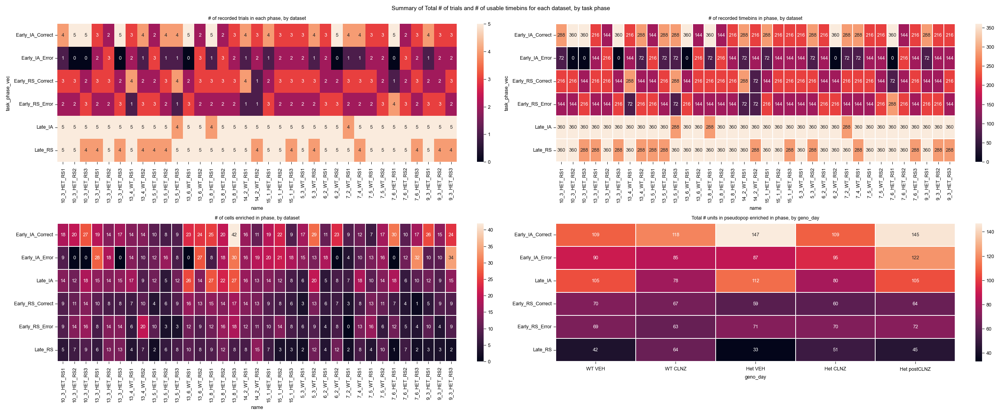

In [ ]:
#gather trial types
trial_type_by_subj = get_num_trials_by_type_in_subject(single_trial_tseries_w_enrich, 'task_phase_vec').fillna(0);
trial_type_by_subj[phase_names] = trial_type_by_subj[phase_names].astype(int)
neuron_enrichment =  single_trial_tseries_w_enrich.groupby(['name', 'geno_day', 'neuron_ID'])[phase_names].mean().reset_index()
phase_enrichment_by_subj = neuron_enrichment[list(phase_names) + ['name', 'geno_day']].groupby(by = ['name', 'geno_day']).sum().reset_index()

#make figures
unit_count_fig, axs = plot_unit_enrich_by_phase_summary((17,7), trial_type_by_subj,phase_enrichment_by_subj,geno_order_w_WT_CLNZ, phase_names,numeric_col)
#save as a fig
pdf_name = f"Enrichment of {units} and # of samples per phase"
save_fig_as_filetype_list(unit_count_fig, pdf_name , subfolder_names, ['pdf', 'png'])

#### Save dataset information

In [ ]:
#save date run
#save data file used
#save N params

### New Pseudopop generation by resampling cell activity time-series

#### Get all time-series corresponding to dataset N

In [ ]:
single_trial_tseries_w_enrich= single_trial_tseries_w_enrich.assign(**{'unique_ID':single_trial_tseries_w_enrich.name.str.cat(
    single_trial_tseries_w_enrich.neuron_ID.astype(str), sep = "-"), 'any_enrichment':  single_trial_tseries_w_enrich[phase_names].sum(axis = 1)})

trial_list_by_dataset = get_trial_num_in_phase_by_dataset( single_trial_tseries_w_enrich)
##important- threshold to take datasets with >1 trials per section ( to have enough space of neurons)
trial_list_by_dataset= trial_list_by_dataset[trial_list_by_dataset.count_of_trials >1]
enrich_unit_ID_by_name_df =get_ID_enriched_units_by_phase(single_trial_tseries_w_enrich, 'unique_ID', 'enriched_in_phase')
dataset_name_by_geno_day = enrich_unit_ID_by_name_df.groupby('geno_day')['name'].unique().reset_index()
#add unique identifier that's (dataset_name + neuron_ID) to retain neuron ID info

In [ ]:
enrich_unit_ID_by_name_df.tail()

,name,geno_day,task_phase_vec,unique_ID,num_enriched_units
198,9_3_HET_RS3,Het postCLNZ,Early_IA_Error,"[9_3_HET_RS3-6, 9_3_HET_RS3-9, 9_3_HET_RS3-12,...",34
199,9_3_HET_RS3,Het postCLNZ,Early_RS_Correct,"[9_3_HET_RS3-40, 9_3_HET_RS3-62, 9_3_HET_RS3-7...",9
200,9_3_HET_RS3,Het postCLNZ,Early_RS_Error,"[9_3_HET_RS3-25, 9_3_HET_RS3-45, 9_3_HET_RS3-6...",9
201,9_3_HET_RS3,Het postCLNZ,Late_IA,"[9_3_HET_RS3-9, 9_3_HET_RS3-25, 9_3_HET_RS3-31...",15
202,9_3_HET_RS3,Het postCLNZ,Late_RS,"[9_3_HET_RS3-3, 9_3_HET_RS3-130]",2


## Find accuracy of decoding in distribution / record results

#### package all real enrichewd cell activations for future use

In [ ]:
## make real dataset storage
dataset_name_by_geno_day
phase_enrichment_by_subj
class_matrix_store  = make_dataset_matrix_store_only(phase_names, single_trial_tseries_w_enrich,unit_ID_col,enrich_unit_ID_by_name_df, numeric_col, trial_list_by_dataset,dataset_name_by_geno_day,phase_enrichment_by_subj)

Get enrich in  Early_IA_Correct act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']
Get enrich in  Early_IA_Error act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']
Get enrich in  Late_IA act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']
Get enrich in  Early_RS_Correct act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']
Get enrich in  Early_RS_Error act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']
Get enrich in  Late_RS act. in  ['Early_IA_Correct' 'Early_IA_Error' 'Late_IA' 'Early_RS_Correct'
 'Early_RS_Error' 'Late_RS']


### Run in-distribution decoding pseudopopulation loop

In [ ]:
def get_test_precision_recall_acc(test_set_data, test_set_labels, trained_model):
#TO- given model already trained on test set, create prediction vec, then calculate precision and recall
    prediction_vec =trained_model.predict(test_set_data)
    true_positive_vec = test_set_labels*prediction_vec
    ## get score metrics
    precision = (1+np.sum(true_positive_vec))/(1+ np.sum(prediction_vec)) #precision = % of predicted 1 / true 1
    recall = (1+ np.sum(true_positive_vec))/ (1+np.sum(test_set_labels)) #recall =  % of predicted 1/ all 1
    acc = np.mean(prediction_vec == test_set_labels)
    return precision, recall,acc

In [ ]:
def run_N_stage_pair_decoders(class_matrix_store,class_comparisons, k_folds:int | None, test_size:float|None, num_resample:int, n_pseudopop_run_range:list):
    '''To- given a predefined range of numbers to uterate over as run #s, run SVM decoding thoese N times on ensemble, stage, and geno-day pairs  '''
    all_run_record_store = []#create storage for all run information for later concat
    #declare variables for local use
    if test_size is None:
        test_size = 0.25
    if k_folds is None:
        k_folds = 4
    phase_names = class_matrix_store.keys()
    for n_run in n_pseudopop_run_range:
        for e_phase in phase_names:#set enrichment type to use# e_phase = "Early_IA_Correct" #100 perms- 7 min for all activity x geno_day groups per e-phase iter
            for geno_day_curr in class_matrix_store['Late_RS']['Late_RS'].keys(): #set geno to use
                ensemble_resample_in_phase_dict = {}
                for class_name in phase_names:
                    class_matrix = resample_into_class_matrix(class_matrix_store,num_resample, e_phase, class_name, geno_day_curr)
                    ensemble_resample_in_phase_dict[class_name] = class_matrix

                for phase_count, phase_pair in enumerate(class_comparisons): #once genotype & enrichment filter, specified, compare phase detection
                    class_0,class_1 = phase_pair[0], phase_pair[1] # print(f"{geno_day_curr}, {e_phase}-enriched units decode: {phase_pair}")
                    ## make training set
                    class_mat_0 =ensemble_resample_in_phase_dict[class_0]
                    class_mat_1 =ensemble_resample_in_phase_dict[class_1]
                    concat_matrix,concat_labels =fast_pack_data_local(class_mat_0, class_mat_1,0,1)        #returns concat_matrix, and concat_labels
                    concat_matrix = concat_matrix.T.values #.T.values of concat matrix is to reshape mat into what scikit wants from you

                    cv = model_selection.StratifiedShuffleSplit(n_splits = k_folds, test_size =test_size)#Create CV object do leave one out split using minority class indices
                    target_info = {"pseudopop_run_num": n_run, 'class_0': class_0,'class_1' : class_1,"enriched_group": e_phase, 'geno_day': geno_day_curr} #speficy info about what classes being decoded
                    split_records = [] #NOW, ONLY TAKE ACCURACY OF EACH SPLIT AND AVERAGE IT OVER SPLITS

                    for split_count, (train, test) in enumerate(cv.split(np.zeros(len(concat_labels)), concat_labels)):
                        model = svm.LinearSVC(C= 1, max_iter=1000, penalty=reg_penalty, dual=False, verbose= 0) #make new model per geno_day classifier split
                        trained_model = model.fit(concat_matrix[train,:], concat_labels[train])                 # score_real = trained_model.score( concat_matrix[test,:], concat_labels[test])#get accuracy
                        #get accuracy
                        prediction_vec =trained_model.predict(concat_matrix[test,:])
                        true_pos= np.sum([np.array([prediction_vec == 1]) &  np.array([concat_labels[test]==1])])
                        true_neg= np.sum([np.array([prediction_vec == 0]) &  np.array([concat_labels[test]==0])])
                        false_pos =  np.sum([np.array([prediction_vec == 1]) &  np.array([concat_labels[test]==0])])
                        false_neg =  np.sum([np.array([prediction_vec == 0]) &  np.array([concat_labels[test]==1])])
                        score_real = np.mean(prediction_vec == concat_labels[test])
                        # precision, recall,score_real = get_test_precision_recall_acc( concat_matrix[test,:], concat_labels[test], trained_model)
                        curr_split_info = {'split': split_count+1, 'accuracy': score_real,
                                             'num_features_used': trained_model.n_features_in_,
                                             'num_nonzero_coef': np.sum(np.abs(trained_model.coef_)>0),
                                             'train_pos_sample':  np.sum(concat_labels[train] ==1),
                                             'train_neg_sample':np.sum(concat_labels[train] ==0),
                                             'test_pos_sample':np.sum(concat_labels[train]==1),
                                             'test_neg_sample': np.sum(concat_labels[train]==1),
                                           'true_pos': true_pos,'true_neg':true_neg,
                                           'false_pos':false_pos, 'false_neg' :false_neg

                                            }
                        split_records.append(curr_split_info)# curr_split_info =#append current test-train split info to a list of dicts, which will then be concatenated
                    #end of split loop, avg split performance and move on
                    split_summary = pd.DataFrame.from_records(split_records)
                    split_metrics = split_summary.mean(numeric_only = True)
                    #get metadata,l turn dict to string
                    split_labels = pd.Series(target_info)
                    split_summary = pd.concat([split_metrics,split_labels],ignore_index = False)
                    split_summary['train_size'] = 1-test_size
                    split_summary['k_folds'] = k_folds
                    all_run_record_store.append(split_summary) #store performance information by split run
    #once done with all bootstraps, create from records
    all_run_record_store =pd.DataFrame.from_records(all_run_record_store)
    return all_run_record_store

In [ ]:
# 5.18.24 stats: #1 run- Wall time: 28.7 s|# 10 runs- 5 minutes|# 20 runs-10min|# 500 runs- 4.5 hours
#5.19.24 stats (single storage, then as needed resample): #5 runs- 1.5 min|#10 iter = 3min 11|#20- 6 min
#hyperparameters for decoding
num_resample = 400
n_pseudopop_runs = 1000 #number of times you 1) create pseudopop and 2) decode with it
reg_penalty = 'l2'
k_folds = 4 #first iter is 5 fold cv
test_size = 0.25 #new test size
## set
n_jobs = 8
start_end_iter = make_chunked_iterator_of_ranges(0, n_pseudopop_runs, n_jobs)
# set up parallel batch, test once
partial_param_svm_func = partial(run_N_stage_pair_decoders,class_matrix_store,class_comparisons,k_folds, test_size, num_resample)
partial_param_svm_func.args

N_batches: 8
Batch_size: 125


({'Early_IA_Correct': {'Early_IA_Correct': {'Het CLNZ': {'10_3_HET_RS2':                   -3.0s to -2.75s  -2.75s to -2.5s  -2.5s to -2.25s  \
     unique_ID                                                             
     10_3_HET_RS2-5                0.0              0.0              0.0   
     10_3_HET_RS2-10               0.0              0.0              0.0   
     10_3_HET_RS2-12               0.0              0.0              0.0   
     10_3_HET_RS2-21               0.0              1.0              0.4   
     10_3_HET_RS2-34               1.0              1.0              1.0   
     10_3_HET_RS2-44               0.0              0.0              0.0   
     10_3_HET_RS2-56               0.0              0.0              0.0   
     10_3_HET_RS2-60               0.0              0.0              0.4   
     10_3_HET_RS2-69               0.6              0.4              0.8   
     10_3_HET_RS2-90               1.0              1.0              1.0   
     10_3_HET_RS2-10

In [ ]:
test_decode = partial_param_svm_func([0])
test_decode

,split,accuracy,num_features_used,num_nonzero_coef,train_pos_sample,train_neg_sample,test_pos_sample,test_neg_sample,true_pos,true_neg,false_pos,false_neg,pseudopop_run_num,class_0,class_1,enriched_group,geno_day,train_size,k_folds
0,2.5,0.98500,81.0,81.00,300.0,300.0,300.0,300.0,100.00,97.00,3.00,0.00,0,Early_IA_Correct,Early_IA_Error,Early_IA_Correct,Het CLNZ,0.75,4
1,2.5,0.99875,109.0,109.00,300.0,300.0,300.0,300.0,100.00,99.75,0.25,0.00,0,Early_IA_Correct,Early_RS_Correct,Early_IA_Correct,Het CLNZ,0.75,4
2,2.5,0.94500,81.0,62.50,300.0,300.0,300.0,300.0,94.75,94.25,5.75,5.25,0,Early_IA_Error,Early_RS_Error,Early_IA_Correct,Het CLNZ,0.75,4
3,2.5,0.94250,109.0,79.00,300.0,300.0,300.0,300.0,94.00,94.50,5.50,6.00,0,Early_RS_Correct,Early_RS_Error,Early_IA_Correct,Het CLNZ,0.75,4
4,2.5,0.88000,109.0,89.75,300.0,300.0,300.0,300.0,91.00,85.00,15.00,9.00,0,Late_IA,Late_RS,Early_IA_Correct,Het CLNZ,0.75,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,2.5,0.80000,30.0,18.00,300.0,300.0,300.0,300.0,93.00,67.00,33.00,7.00,0,Early_RS_Correct,Early_RS_Error,Late_RS,WT VEH,0.75,4
236,2.5,0.89000,42.0,42.00,300.0,300.0,300.0,300.0,83.25,94.75,5.25,16.75,0,Late_IA,Late_RS,Late_RS,WT VEH,0.75,4
237,2.5,0.79375,42.0,36.00,300.0,300.0,300.0,300.0,78.25,80.50,19.50,21.75,0,Early_IA_Correct,Late_IA,Late_RS,WT VEH,0.75,4
238,2.5,0.93375,42.0,42.00,300.0,300.0,300.0,300.0,89.50,97.25,2.75,10.50,0,Early_RS_Correct,Late_RS,Late_RS,WT VEH,0.75,4


In [ ]:
output_SVM_runs = Parallel(n_jobs= n_jobs, verbose = 9)(delayed(partial_param_svm_func)(x) for x in start_end_iter)
# 20j, 50batch of 1000- 11 min 9pm
print(len(output_SVM_runs))
# all_run_record_store = [pd.concat(x) for x in output_SVM_runs] #each elem of output = 1 paralell run
decode_scores = pd.concat(output_SVM_runs)
#### save decoding run output:
decode_scores['classes decoded'] = decode_scores.class_0.str.cat(decode_scores.class_1, sep = '_v_')
decode_scores['classes decoded'] = decode_scores['classes decoded'].astype('category')
decode_scores = decode_scores.rename({'class_0': 'Phase1', 'class_1':'Phase2'}, axis = 1)
decode_scores[['enriched_group', 'Phase2', 'Phase1', 'geno_day']] =decode_scores[['enriched_group', 'Phase2', 'Phase1', 'geno_day']].astype('category')

decode_scores['timebin_size'] = hyper_param_dict['bin_size']
decode_scores['run_end_time'] = datetime.now()
decode_scores['dataset_folder_name'] = analysis_data_to_use_folder
decode_scores.info()

decode_file_name = f"Decode enrich_unit {n_pseudopop_runs} pseudopop {data_type} {date_tag}.parquet"
decode_scores.to_parquet(decode_file_name, compression='snappy')
print(f"decoding file name: {decode_file_name}")

## save metatdata of current run
f = open("last_decoding_run_info.txt", "w")
decode_run_info_str = f"latest decoding output filename: {decode_file_name}. Run end: {date_tag}. Data used: {analysis_data_to_use_folder}"
f.write(decode_run_info_str)
f.close()
print(decode_run_info_str)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed: 31.3min remaining: 93.8min
[Parallel(n_jobs=8)]: Done   3 out of   8 | elapsed: 31.4min remaining: 52.3min
[Parallel(n_jobs=8)]: Done   4 out of   8 | elapsed: 31.5min remaining: 31.5min
[Parallel(n_jobs=8)]: Done   5 out of   8 | elapsed: 31.5min remaining: 18.9min
[Parallel(n_jobs=8)]: Done   6 out of   8 | elapsed: 31.5min remaining: 10.5min
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed: 31.6min finished


8
<class 'pandas.core.frame.DataFrame'>
Int64Index: 240000 entries, 0 to 29999
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   split                240000 non-null  float64       
 1   accuracy             240000 non-null  float64       
 2   num_features_used    240000 non-null  float64       
 3   num_nonzero_coef     240000 non-null  float64       
 4   train_pos_sample     240000 non-null  float64       
 5   train_neg_sample     240000 non-null  float64       
 6   test_pos_sample      240000 non-null  float64       
 7   test_neg_sample      240000 non-null  float64       
 8   true_pos             240000 non-null  float64       
 9   true_neg             240000 non-null  float64       
 10  false_pos            240000 non-null  float64       
 11  false_neg            240000 non-null  float64       
 12  pseudopop_run_num    240000 non-null  int32         
 13  Phase1       

In [ ]:
#create run information df
run_info = {'run_date': date_tag,
            'decoding_type':'in_distribution',
            'run_end_time': datetime.now(),
            'run_dataset_used': analysis_data_to_use_folder,
            'run_output_filename':decode_file_name,
            'n_jobs': n_jobs,
            'n_iterations': n_pseudopop_runs,
            'dataset_source': analysis_data_to_use_folder,
           }
run_df_in_distrib = pd.DataFrame([run_info])
run_df_in_distrib

,run_date,decoding_type,run_end_time,run_dataset_used,run_output_filename,n_jobs,n_iterations,dataset_source
0,31_May_2025,in_distribution,2025-05-31 11:00:20.282584,11-Dec-2024_event_fixed_stage_labels,Decode enrich_unit 1000 pseudopop post_outcome...,8,1000,11-Dec-2024_event_fixed_stage_labels


#### Summary plotsof current run

Text(0.5, 0.98, ' (Criteria 1: Recording needs at least 2 trials in phase) 1000 Pseudopop runs: mean SVM accuracy over 4 CV folds, for enriched cells pseudopops')

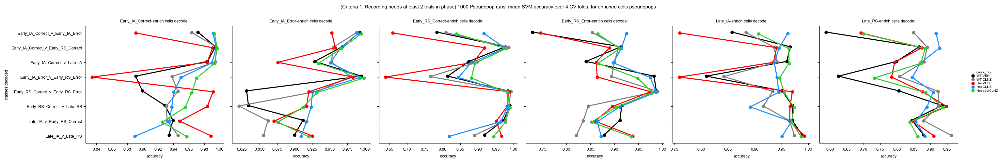

In [ ]:
## average decoding over each fold
pop_mean_decoding = decode_scores.groupby(by = ['geno_day', 'enriched_group', 'classes decoded', 'pseudopop_run_num'])[['accuracy']].mean().reset_index()

g = sns.catplot(kind = 'point', height = 3.3, data = pop_mean_decoding, dodge = True,sharey = True, sharex = False,col = 'enriched_group', y = 'classes decoded', x = 'accuracy', **geno_color_dict_w_WT_CLNZ)
g.fig.subplots_adjust(top = 0.85)
g.set_titles("{col_name}-enrich cells decode:")
g.fig.suptitle(f" (Criteria 1: Recording needs at least 2 trials in phase) {n_pseudopop_runs} Pseudopop runs: mean SVM accuracy over {k_folds} CV folds, for enriched {units} pseudopops")

## time-dependent decoding

In [ ]:
def get_start_ends_of_sliced_range(length, chunk_size):
    """
    Divides a range of indices into N chunks, ensuring all chunks except the last are the same size.
    Args:
        length (int): The total length of the range.
        chunk_size (int): The size of chunks.
       Returns: np.ndarray: An array of (start, stop) tuples representing the chunk ranges.
    """
    # Compute the size of each chunk
    n_chunks = length // chunk_size
    # Create an array of start indices
    starts = np.arange(0, length, chunk_size)
    # Compute inclusive stop indices so each chunk has exactly chunk_size rows
    stops = starts + chunk_size - 1
    stops[-1] = length - 1
    return np.column_stack((starts, stops))


In [ ]:
#function for bootstrapping PCA
def run_SVM_on_timebins_N_bootstrap(class_matrix_store,class_comparisons, frame_cols, num_resample:int,frame_batch_size, bootstrap_range):
    '''TO- run bootstrap to get cosine sim and sil score of decoded classes for each elem N in bootstrap_range '''
    output_list = [] #create class matrix store- DONE PREV
    stage_names = class_matrix_store.keys()
    geno_order = class_matrix_store['Late_IA']['Late_IA'].keys()
    #determine range slice creation
    if frame_batch_size is None: #if default argument, batch size == whole frame cols
        col_ranges = [(0, len(frame_cols))]
    elif type(frame_batch_size) is list:  #use the input col ranges
        col_ranges = frame_batch_size #format: [tuple(row) for row in col_ranges]
    else:
        col_ranges = get_start_ends_of_sliced_range(len(frame_cols), frame_batch_size)
        col_ranges= [tuple(row) for row in col_ranges]
    #run main body
    for b in bootstrap_range: #create B class matrix store (where b = number of resamples)
        for stage_enriched_in in stage_names:
            for geno_curr in geno_order:
                ensemble_resample_in_phase_dict = {}
                #if doing time-bin wise resampling, create range of mats to useabs
                for class_name in stage_names: #store the versions for this bootstrap run
                    ensemble_resample_in_phase_dict[class_name]= dict() #allow for ranges for subsample to be used as keys
                    for subset in col_ranges: #for each start/end value in ranges, draw a matrix within those frame cols of interest
                        subsample_range = frame_cols[subset[0]:subset[1]]
                        class_matrix = resample_into_class_matrix(class_matrix_store,num_resample,stage_enriched_in, class_name, geno_curr,
                                                                  subsample_range=subsample_range)#subsample range does-
                        ensemble_resample_in_phase_dict[class_name][subset] = class_matrix

                for phase_count, phase_pair in enumerate(class_comparisons): #once genotype & enrichment filter, specified, compare phase detection
                    class_0,class_1 = phase_pair[0], phase_pair[1] # print(f"{geno_day_curr}, {e_phase}-enriched units decode: {phase_pair}")
                    subset_info = []

                    for subset in col_ranges: #for each start/end value in ranges, draw a matrix within those frame cols of interest
                        class_mat_0 =ensemble_resample_in_phase_dict[class_0][subset]
                        class_mat_1 =ensemble_resample_in_phase_dict[class_1][subset]
                        concat_matrix,concat_labels =fast_pack_data_local(class_mat_0, class_mat_1,0,1)        #returns concat_matrix, and concat_labels
                        concat_matrix = concat_matrix.values.T #.T.values of concat matrix is to reshape mat into what scikit wants from you
                        cv = model_selection.ShuffleSplit(n_splits = k_folds, test_size =test_size)#Create CV object do leave one out split using minority class indices

                        target_info = { 'pseudopop_run_num': b, 'enriched_group': stage_enriched_in,'class_0': class_0, 'class_1': class_1, 'geno_day': geno_curr,
                                     'frame_subset': subset, 'bin_start_index': subset[0], 'bin_end_index': subset[1], 'bin_start_str': frame_cols[subset[0]],
                                     }
                        split_summary = []
                        for split_count, (train, test) in enumerate(cv.split(np.zeros(len(concat_labels)), concat_labels)):
                            model = svm.LinearSVC(C= 1, max_iter=1000, penalty=reg_penalty, dual=False, verbose= 0) #make new model per geno_day classifier split
                            trained_model = model.fit(concat_matrix[train,:], concat_labels[train])                 # score_real = trained_model.score( concat_matrix[test,:], concat_labels[test])#get accuracy
                            precision, recall,score_real = get_test_precision_recall_acc( concat_matrix[test,:], concat_labels[test], trained_model)
                             #get correct bin names
                            if subset[1]==len(frame_cols):
                                bin_end_str = frame_cols[subset[1]-1]
                            else:
                                bin_end_str = frame_cols[subset[1]]
                            #ending str = moved 1 index if index == length of acutal frame col, as you're indexing in exclusive manner
                            curr_split_info = {**target_info, 'mean_acc': score_real,
                                               'num_features_used': trained_model.n_features_in_,
                                               'num_nonzero_coef': np.sum(np.abs(trained_model.coef_)>0), }
                            # split_summary =curr_split_info #gather performance for split N
                            split_summary.append(curr_split_info['mean_acc'])# curr_split_info =#append current test-train split info to a list of dicts, which will then be concatenated
                        #save split info for the given subset
                        #after finishing split run, average then store
                        average_acc = np.mean(split_summary)
                        split_summary = {**target_info,'mean_acc': average_acc,'bin_end_str': bin_end_str, 'bin_default_size':frame_batch_size}
                        output_list.append(split_summary) #append dict
                    # all_run_record_store.append(pd.DataFrame.from_records(split_summary)) #store performance information by split run
    #once done with all bootstraps, create from records
    output_list =pd.DataFrame.from_records(output_list)
    return output_list

In [ ]:
%%time
#test data
frame_batch_size= 8 # 3runs = 1min linear &8bin size #1 run- 11s linear &12 bin &200 each sample
x = run_SVM_on_timebins_N_bootstrap(class_matrix_store,class_comparisons, numeric_col, 400,12, [1])
x

CPU times: total: 25 s
Wall time: 30.3 s


,pseudopop_run_num,enriched_group,class_0,class_1,geno_day,frame_subset,bin_start_index,bin_end_index,bin_start_str,mean_acc,bin_end_str,bin_default_size
0,1,Early_IA_Correct,Early_IA_Correct,Early_IA_Error,Het CLNZ,"(0, 11)",0,11,-3.0s to -2.75s,0.99875,-0.25s to -0.0s,12
1,1,Early_IA_Correct,Early_IA_Correct,Early_IA_Error,Het CLNZ,"(12, 23)",12,23,0.0s to 0.25s,0.99625,2.75s to 3.0s,12
2,1,Early_IA_Correct,Early_IA_Correct,Early_IA_Error,Het CLNZ,"(24, 35)",24,35,3.0s to 3.25s,1.00000,5.75s to 6.0s,12
3,1,Early_IA_Correct,Early_IA_Correct,Early_IA_Error,Het CLNZ,"(36, 47)",36,47,6.0s to 6.25s,1.00000,8.75s to 9.0s,12
4,1,Early_IA_Correct,Early_IA_Correct,Early_IA_Error,Het CLNZ,"(48, 59)",48,59,9.0s to 9.25s,0.99625,11.75s to 12.0s,12
...,...,...,...,...,...,...,...,...,...,...,...,...
1435,1,Late_RS,Late_IA,Early_RS_Correct,WT VEH,"(12, 23)",12,23,0.0s to 0.25s,0.90750,2.75s to 3.0s,12
1436,1,Late_RS,Late_IA,Early_RS_Correct,WT VEH,"(24, 35)",24,35,3.0s to 3.25s,0.93750,5.75s to 6.0s,12
1437,1,Late_RS,Late_IA,Early_RS_Correct,WT VEH,"(36, 47)",36,47,6.0s to 6.25s,0.95375,8.75s to 9.0s,12
1438,1,Late_RS,Late_IA,Early_RS_Correct,WT VEH,"(48, 59)",48,59,9.0s to 9.25s,0.91250,11.75s to 12.0s,12


In [ ]:
def get_timebin_iter(frame_cols, frame_batch_size=None):
    if frame_batch_size is None: #if default argument, batch size == whole frame cols
        col_ranges = [(0, len(frame_cols))]
    elif type(frame_batch_size) is list:  #use the input col ranges
        col_ranges = frame_batch_size #format: [tuple(row) for row in col_ranges]
    else:
        col_ranges = get_start_ends_of_sliced_range(len(frame_cols), frame_batch_size)
        col_ranges= [tuple(row) for row in col_ranges]
    return col_ranges

In [ ]:
get_timebin_iter(numeric_col, 5)

[(0, 4),
 (5, 9),
 (10, 14),
 (15, 19),
 (20, 24),
 (25, 29),
 (30, 34),
 (35, 39),
 (40, 44),
 (45, 49),
 (50, 54),
 (55, 59),
 (60, 64),
 (65, 69),
 (70, 71)]

In [ ]:
numeric_col

Index(['-3.0s to -2.75s', '-2.75s to -2.5s', '-2.5s to -2.25s',
       '-2.25s to -2.0s', '-2.0s to -1.75s', '-1.75s to -1.5s',
       '-1.5s to -1.25s', '-1.25s to -1.0s', '-1.0s to -0.75s',
       '-0.75s to -0.5s', '-0.5s to -0.25s', '-0.25s to -0.0s',
       '0.0s to 0.25s', '0.25s to 0.5s', '0.5s to 0.75s', '0.75s to 1.0s',
       '1.0s to 1.25s', '1.25s to 1.5s', '1.5s to 1.75s', '1.75s to 2.0s',
       '2.0s to 2.25s', '2.25s to 2.5s', '2.5s to 2.75s', '2.75s to 3.0s',
       '3.0s to 3.25s', '3.25s to 3.5s', '3.5s to 3.75s', '3.75s to 4.0s',
       '4.0s to 4.25s', '4.25s to 4.5s', '4.5s to 4.75s', '4.75s to 5.0s',
       '5.0s to 5.25s', '5.25s to 5.5s', '5.5s to 5.75s', '5.75s to 6.0s',
       '6.0s to 6.25s', '6.25s to 6.5s', '6.5s to 6.75s', '6.75s to 7.0s',
       '7.0s to 7.25s', '7.25s to 7.5s', '7.5s to 7.75s', '7.75s to 8.0s',
       '8.0s to 8.25s', '8.25s to 8.5s', '8.5s to 8.75s', '8.75s to 9.0s',
       '9.0s to 9.25s', '9.25s to 9.5s', '9.5s to 9.75s', '9.75s to 1

In [ ]:
for s,e in get_timebin_iter(numeric_col, 12):
    print(numeric_col[s],numeric_col[e])

-3.0s to -2.75s -0.25s to -0.0s
0.0s to 0.25s 2.75s to 3.0s
3.0s to 3.25s 5.75s to 6.0s
6.0s to 6.25s 8.75s to 9.0s
9.0s to 9.25s 11.75s to 12.0s
12.0s to 12.25s 14.75s to 15.0s


In [ ]:
start_end_iter = make_chunked_iterator_of_ranges(0,100, 7)
start_end_iter

N_batches: 7
Batch_size: 14


[array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]),
 array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]),
 array([42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]),
 array([56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]),
 array([70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]),
 array([84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]),
 array([ 98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110,
        111])]

In [ ]:
# set up parallel batch
num_resample = 400
n_jobs = 10
frame_batch_size= 12
n_bootstraps  = 1000
start_end_iter = make_chunked_iterator_of_ranges(0,n_bootstraps, n_jobs)
#12 min, 100 runs
partial_timebin_svm_func = partial(run_SVM_on_timebins_N_bootstrap, class_matrix_store,class_comparisons,
                                   numeric_col, num_resample, frame_batch_size)

N_batches: 10
Batch_size: 100


In [ ]:
output_SVM_runs = Parallel(n_jobs= n_jobs, verbose = 9)(delayed(partial_timebin_svm_func)(x) for x in start_end_iter)
# 20j, 50batch of 1000- 11 min 9pm
#5 jobs, 100 batch size, 500 resamp, 12 frame batch- 26min
#7 jobs, 71 batch size, 500 resamp, 12 frame batch, 500 bootstrap- 25min
#6 jobs, 16 batch size, 400 resamp, 12 frame batch, 100 bootstrap- 7min
# 5 jobs, 100 per batch, 400 resamp, 12 frame/batch, 500 bootstrap- 27min
# 5 jobs, 100 per batch, 400 resamp, 12 frame/batch, 1000 bootstrap- 50min

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


In [ ]:
print(len(output_SVM_runs))
# all_run_record_store = [pd.concat(x) for x in output_SVM_runs] #each elem of output = 1 paralell run
timedecode_scores = pd.concat(output_SVM_runs)
timedecode_scores['classes decoded'] = timedecode_scores.class_0.str.cat(timedecode_scores.class_1, sep = '_v_')#.astype('category')
timedecode_scores.head()

In [ ]:
# %%time
## PACKAGE information into function ## versioning info
#Wall time: 55min 54s to save csvb
timedecode_scores = timedecode_scores.rename({'class_0': 'Phase1', 'class_1':'Phase2'}, axis = 1)
timedecode_scores['timebin_size'] = hyper_param_dict['bin_size']
timedecode_scores['run_end_time'] = datetime.now()
timedecode_scores['dataset_folder_name'] = analysis_data_to_use_folder
timedecode_scores.bin_start_str = timedecode_scores.bin_start_str.str.split(' to ').str[0]
timedecode_scores.bin_end_str = timedecode_scores.bin_end_str.str.split(' to ').str[1]
timedecode_scores['bin_name'] = timedecode_scores.bin_start_str.str.cat( timedecode_scores.bin_end_str, sep = ' to ')
timedecode_scores['frame_subset'] = timedecode_scores['frame_subset']#.astype('category')
timedecode_scores.loc[:,['enriched_group', 'Phase1','Phase2', 'geno_day']] = timedecode_scores.loc[:,['enriched_group', 'Phase1','Phase2', 'geno_day']]#.astype('category')
print(timedecode_scores.info())
timedecode_scores

In [ ]:
%%time
decode_file_name = f"Timebin Decoding- {n_bootstraps}_bootstrap {data_type} {date_tag}.parquet"
timedecode_scores.to_parquet(decode_file_name, compression='snappy')
print(f"decoding file name: {decode_file_name}")
# timedecode_scores.to_csv(decode_csv_name)
print(timedecode_scores.info())
timedecode_scores

In [ ]:
## save metatdata of current run
f = open("last_time_decoding_run_info.txt", "w")
decode_run_info_str = f"latest time-based decoding output filename: {decode_file_name}. Run end: {date_tag}. Data used: {analysis_data_to_use_folder}"
f.write(decode_run_info_str)
f.close()
print(decode_run_info_str)

## out of distribution decoder generalizations

In [ ]:
#create out of distribution handles
out_of_dist_train_sets = [
    [phase_names[0], phase_names[3]],#train on- early IA corr vs. early RS corr
     [phase_names[1], phase_names[4]],#train on- early IA err vs.l early RS err
    [phase_names[0], phase_names[1]],#train on-early IA corr vs. early IA err
    [phase_names[3], phase_names[4]],#train on- early RS corr vs. early RS err
    ]
out_of_dist_test_sets = [
    [phase_names[1], phase_names[4]],#test on- early IA err vs.l early RS err
    [phase_names[0], phase_names[3]],#test on- early IA corr vs. early RS corr
    [phase_names[3], phase_names[4]],##test on- early RS corr vs. early RS err
    [phase_names[0], phase_names[1]],##test on- early IA corr vs. early IA err
    ]
print(f"train sets: {out_of_dist_train_sets}")
print(f"Test sets: {out_of_dist_test_sets}")

#### Run parallel decoding to out of distribution

In [ ]:
#test averaging of true pos rate etc
test_val = [1,2,3,4,5]
tests = []
for outer_count, outer in enumerate([x+2 for x in test_val]):
    inner = []
    for count,t in enumerate(test_val):
        # print(count,t)
        curr_info = {'iter':outer,'target':count,
                     'accuracy': t,
                     'true_pos': 0.4,
                     'true_neg':0.2,
                     'false_pos':0.4,
                     'false_neg' :0.5
                    }
        inner.append(curr_info)
    test = pd.DataFrame.from_records(inner)
    test_mean= test.mean(numeric_only = True)
    new_vals = pd.Series({'counter':outer_count, 'str': "S", 'outer_val':outer})
    test_mean = pd.concat([test_mean, new_vals],ignore_index = False)  # Retain identifier for grouping
    tests.append(test_mean)


In [ ]:
test.mean(numeric_only = True)

In [ ]:

print(type(tests[0]))
pd.DataFrame(tests) #make dataframe of

In [ ]:
# function for out of distribution decoding
def run_N_decoder_out_of_distribution(class_matrix_store,out_of_dist_train_sets, out_of_dist_test_sets, num_resample:int, test_size= None, k_folds=None, n_pseudopop_run_range= None):
    '''To- given a predefined range of numbers to uterate over as run #s, run SVM decoding thoese N times on ensemble, stage, and geno-day pairs  '''
    all_run_record_store = []#create storage for all run information for later concat
    #local var def
    if test_size is None:
        test_size = 0.5
    if k_folds is None:
        k_folds = 2
    phase_names = class_matrix_store.keys()
    for n_run in n_pseudopop_run_range:
        for e_phase in phase_names:#set enrichment type to use# e_phase = "Early_IA_Correct" #100 perms- 7 min for all activity x geno_day groups per e-phase iter
            for geno_day_curr in class_matrix_store['Late_RS']['Late_RS'].keys(): #set geno to use
                ensemble_resample_in_phase_dict = {}
                for class_name in phase_names:
                    class_matrix = resample_into_class_matrix(class_matrix_store,num_resample, e_phase, class_name, geno_day_curr)
                    ensemble_resample_in_phase_dict[class_name] = class_matrix

                for phase_count, phase_pair in enumerate(out_of_dist_train_sets): #once genotype & enrichment filter, specified, compare phase detection
                    class_0_train,class_1_train = phase_pair[0], phase_pair[1] # print(f"{geno_day_curr}, {e_phase}-enriched units decode: {phase_pair}")
                    ## make training set
                    class_mat_0_train =ensemble_resample_in_phase_dict[class_0_train]
                    class_mat_1_train =ensemble_resample_in_phase_dict[class_1_train]
                    concat_matrix_train,concat_labels_train, =fast_pack_data_local(class_mat_0_train, class_mat_1_train,0,1)        #returns .T.values of concat_matrix, and concat_labels
                    ##iterate over test pairs
                    test_pair = out_of_dist_test_sets[phase_count]
                    # for phase_count, test_pair in enumerate(out_of_dist_test_sets): #once genotype & enrichment filter, specified, compare phase detection
                    class_0_test,class_1_test = test_pair[0], test_pair[1] # print(f"{geno_day_curr}, {e_phase}-enriched units decode: {phase_pair}")
                    class_mat_0_test =ensemble_resample_in_phase_dict[class_0_test]
                    class_mat_1_test =ensemble_resample_in_phase_dict[class_1_test]
                    concat_matrix_test,concat_labels_test, =fast_pack_data_local(class_mat_0_test, class_mat_1_test,0,1)        #returns .T.values of concat_matrix, and concat_labels
                    #get test objects for current setup, aligning size of datasets
                    unit_IDs_test =concat_matrix_test.index.values
                    unit_IDs_train = concat_matrix_train.index.values

                    train_IDs_in_test_bool = [u in unit_IDs_test for u in unit_IDs_train] #list of: unit in TEST_UNITS for unit in TRAIN_UNIT
                    test_IDs_in_train_bool = [u in unit_IDs_train for u in unit_IDs_test]#list of: unit in Trin_UNITS for unit in Test_UNIT
                    #now that IDs are extracted, pivot mats
                    concat_matrix_test = concat_matrix_test.T.values
                    concat_matrix_train = concat_matrix_train.T.values
                    #restrict testing to units that have >0 activity in test and trian datasets
                    concat_matrix_test= concat_matrix_test[:,test_IDs_in_train_bool]
                    concat_matrix_train= concat_matrix_train[:,train_IDs_in_test_bool]
                    cv = model_selection.StratifiedShuffleSplit(n_splits = k_folds, test_size =test_size)#Create CV object do leave one out split using minority class indices

                    ##MODEL
                    split_records = []

                    for split_count, (train, test) in enumerate(cv.split(np.zeros(len(concat_labels_train)), concat_labels_train)):
                        #Train on entire generated train mat, test on the same
                        target_info = {"pseudopop_run_num": n_run,
                                       "enriched_group": e_phase,'geno_day': geno_day_curr,
                                       'class_0_train' : class_0_train, 'class_1_train': class_1_train,
                                       'class_0_test' : class_0_test, 'class_1_test': class_1_test,'regularization': reg_penalty, 'date_run': datetime.now()} #speficy info about what classes being decoded

                        model = svm.LinearSVC(C= 1, max_iter=1000, penalty=reg_penalty, dual=False, verbose= 0) #make new model per geno_day classifier split
                        trained_model = model.fit(concat_matrix_train[train,:], concat_labels_train[train])                     # reorg_train_range, reorg_test_range = perm_range(len(concat_labels['train'])),  perm_range(len(concat_labels['test']))                     #reorder activity and labels to remove temporal ordering

                        ## perdiction on test data
                        test_data = concat_matrix_test#concat_matrix_test[test,:]
                        test_labels = concat_labels_test#concat_labels_test[test]
                        prediction_vec =trained_model.predict(test_data)
                        score_real = np.mean(prediction_vec == test_labels)                      # precision, recall,score_real = get_test_precision_recall_acc( concat_matrix_test[test,:], concat_labels_test[test], trained_model)

                        true_pos= np.mean([np.array([prediction_vec == 1]) &  np.array([  test_labels==1])])
                        true_neg= np.mean([np.array([prediction_vec == 0]) &  np.array([  test_labels==0])])
                        false_pos =  np.mean([np.array([prediction_vec == 1]) &  np.array([ test_labels==0])])
                        false_neg =  np.mean([np.array([prediction_vec == 0]) &  np.array([ test_labels==1])])

                        curr_split_info = { 'accuracy': score_real,
                                           'num_features_used': trained_model.n_features_in_,
                                           'num_nonzero_coef': np.sum(np.abs(trained_model.coef_)>0),
                                           'true_pos': true_pos,'true_neg':true_neg,
                                           'false_pos':false_pos, 'false_neg' :false_neg
                                            }
                        #for a given split, store in list  ONLY NUMERIC VALS
                        split_records.append(curr_split_info)# curr_split_info =#append current test-train split info to a list of dicts, which will then be concatenated

                    #end of split loop, avg split performance and move on
                    split_summary = pd.DataFrame.from_records(split_records)
                    split_metrics = split_summary.mean(numeric_only = True)
                    #get metadata,l turn dict to string
                    split_labels = pd.Series(target_info)
                    split_summary = pd.concat([split_metrics,split_labels],ignore_index = False)
                    split_summary['train_size'] = 1-test_size
                    split_summary['k_folds'] = k_folds
                    all_run_record_store.append(split_summary) #store performance information by split run
                #end of phase pair loop
    all_run_output = pd.DataFrame.from_records(all_run_record_store)
    return all_run_output

In [ ]:
#create partial function and store real data
# set up parallel batch
decode_type = "out_of_distribution"
# test_size = 0.5
# k_folds = 2
# set up parallel batch
num_resample = 800
n_jobs = 10
frame_batch_size= 24
n_bootstraps  = 1000
start_end_iter = make_chunked_iterator_of_ranges(0,n_pseudopop_runs, n_jobs)
start_end_iter
partial_param_svm_func = partial(run_N_decoder_out_of_distribution, class_matrix_store,out_of_dist_train_sets,  out_of_dist_test_sets,num_resample, test_size = 0.25, k_folds = 4)
test_decode = partial_param_svm_func(n_pseudopop_run_range =[0,1])
test_decode

In [ ]:
output_SVM_runs = Parallel(n_jobs= n_jobs, verbose = 9)(delayed(partial_param_svm_func)(n_pseudopop_run_range= x) for x in start_end_iter)
# 20j, 50batch of 1000- 11 min-5 9pm
print(len(output_SVM_runs))

In [ ]:
%%time
## PACKAGE information into function ## versioning info
decode_scores = pd.concat(output_SVM_runs)
decode_scores['timebin_size'] = hyper_param_dict['bin_size']#.astype('category')
decode_scores['run_end_time'] = datetime.now()#.astype('category')
decode_scores['dataset_folder_name'] = analysis_data_to_use_folder#.astype('category')
decode_scores['train_on'] = decode_scores.class_0_train.str.cat(decode_scores.class_1_train, sep = '_')#.astype('category')
decode_scores['test_on'] = decode_scores.class_0_test.str.cat(decode_scores.class_1_test, sep = '_')#.astype('category')
decode_scores['timebin_size'] = hyper_param_dict['bin_size']#.astype('category')

decode_file_name_out_distrib = f"Decode (Out of Distrib) {n_pseudopop_runs} pseudopop {data_type} {date_tag}.parquet"
decode_scores.to_parquet(decode_file_name_out_distrib, compression='snappy')
print(f"decoding csv name: {decode_file_name_out_distrib}")
# decode_scores.to_csv(decode_file_name_out_distrib)
print(decode_scores.info())
decode_scores

In [ ]:
## save metatdata of current run
f = open("last_generalize_decoding_run_info.txt", "w")
decode_run_info_str = f"latest generalize decoding output filename: {decode_file_name_out_distrib}. Run end: {date_tag}. Data used: {analysis_data_to_use_folder}"
f.write(decode_run_info_str)
f.close()
print(decode_run_info_str)

#### Decode out of distribution for single task

#### save csv- summarizing decoing performance

In [ ]:
#create run information df
run_info = {'run_date': date_tag,
            'decoding_type':'out_of_distribution',
            'run_end_time': datetime.now(),
            'run_dataset_used': analysis_data_to_use_folder,
            'run_output_filename':decode_file_name_out_distrib,
            'n_jobs': n_jobs,
            'n_iterations': n_pseudopop_runs,
           }
run_df_general = pd.DataFrame([run_info])
run_df_general

In [ ]:
datasets_location

In [ ]:
current_runs_info = pd.concat([run_df_general,run_df_in_distrib])
current_runs_info

In [ ]:

generalize_svm_record_file = f"Decoder- Out of Distribution - run version record.csv"
svm_file_loc = datasets_location
if not os.path.exists(generalize_svm_record_file):    #create locally then save
    run_record_generalize = current_runs_info
else: #load and add to it
    run_record_generalize= pd.read_csv(generalize_svm_record_file)
    run_record_generalize = pd.concat([run_record_generalize, current_runs_info])
#if CSV doesn't exist, create
run_record_generalize.to_csv(generalize_svm_record_file)
run_record_generalize

#### summary fig